In [1]:
import os
import xarray as xr
import numpy as np 
from pathlib import Path
import matplotlib.pyplot as plt
import torch 
from torch.utils.data import Dataset,DataLoader
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
from torch.optim import Adam 
from einops import rearrange
import tqdm

In [2]:
from denoising_diffusion_pytorch import Unet
from tc_data_loader import TC_xy_Dataset 
from tc_diff_guided import Diffusion_model, count_parameters

/home/cw55/.conda/envs/tcdiff/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
timesteps = 300
batch_size = 8
results_folder = Path("./tc_guide_wvp_rand")

# Dataset

In [4]:
test_data  = TC_xy_Dataset(data_dir='./dataset/tc_data',
                               data_vars=['WVP'],
                               years=[126,127]) 

var WVP year 126: length 3724 
var WVP year 127: length 3521 


# Train the model 

In [5]:
# diffusion model
tc_diff_model = Diffusion_model(timesteps)

In [6]:
# decoder model
device = "cuda" if torch.cuda.is_available() else "cpu"
image_size = test_data.data.shape[-1]
channels = test_data.data.shape[1]

model = Unet(
    dim = 32,
    out_dim=channels,
    channels=channels*2, 
    dim_mults = (1,2,4,8), 
    resnet_block_groups = 4,
    flash_attn = False
)
model.to(device)
print('Total model parameter',count_parameters(model))
model.load_state_dict(torch.load(results_folder/'best_model.ckpt'))

Total model parameter 9201761


<All keys matched successfully>

# Sampling (inference)

In [7]:
def plot(imgs, with_orig=False, row_title=None, **imshow_kwargs):
    
    num_rows = len(imgs) 
    num_cols = len(imgs[0]) + with_orig
    fig, axs = plt.subplots(figsize=(12,4), dpi = 200, nrows=num_rows, ncols=num_cols, squeeze=False)
    for row_idx, row in enumerate(imgs):
        row = [image] + row if with_orig else row
        for col_idx, img in enumerate(row):
            ax = axs[row_idx, col_idx] 
            ax.imshow(np.asarray(img),vmin=20, vmax=80,cmap='jet', **imshow_kwargs)
            ax.set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

    if with_orig:
        axs[0, 0].set(title='Original image')
        axs[0, a0].title.set_size(8)
    if row_title is not None:
        for row_idx in range(num_rows):
            axs[row_idx, 0].set(ylabel=row_title[row_idx])

    plt.tight_layout()
    return fig

In [8]:
def gen_samples(sample_batch_size, obs_ratio_sample, target_data):
    minibatch_size = 64
    sample_all = []
    target_all = []
    for i in range(int(sample_batch_size/minibatch_size)):
        samples, target = tc_diff_model.sample(model, image_size=image_size, batch_size=minibatch_size, 
                                       channels=channels, obs_ratio=obs_ratio_sample,
                                       dataset=target_data) 
        sample_all.append(samples[-1])
        target_all.append(target)
    return np.concatenate(sample_all), np.concatenate(target_all)

sampling loop time step: 100%|██████████| 300/300 [00:13<00:00, 21.78it/s]
/tmp/ipykernel_3418067/1304448900.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax = plt.subplots()
sampling loop time step: 100%|██████████| 300/300 [00:28<00:00, 10.69it/s]


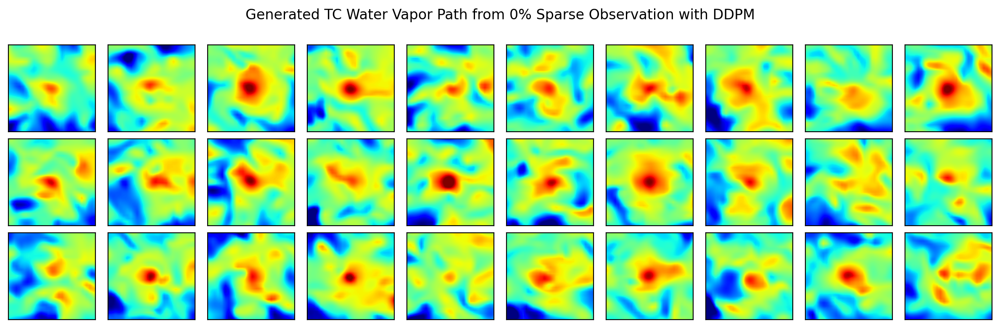

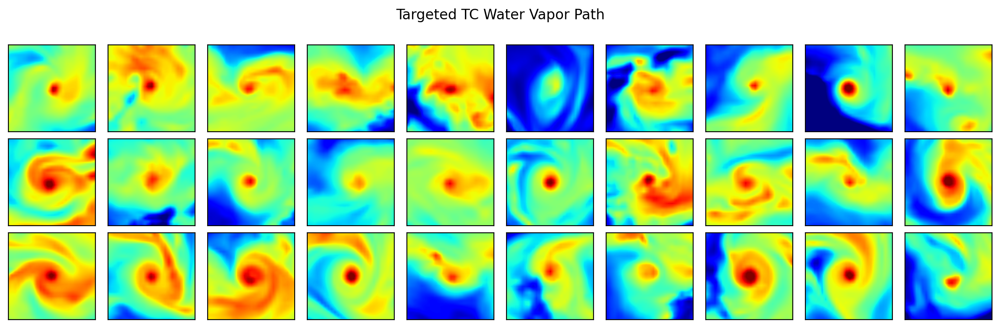

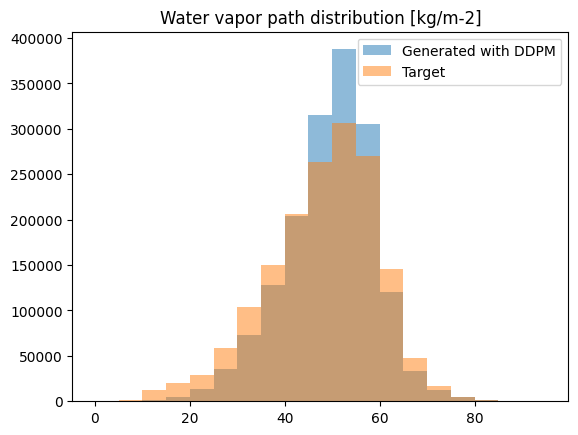

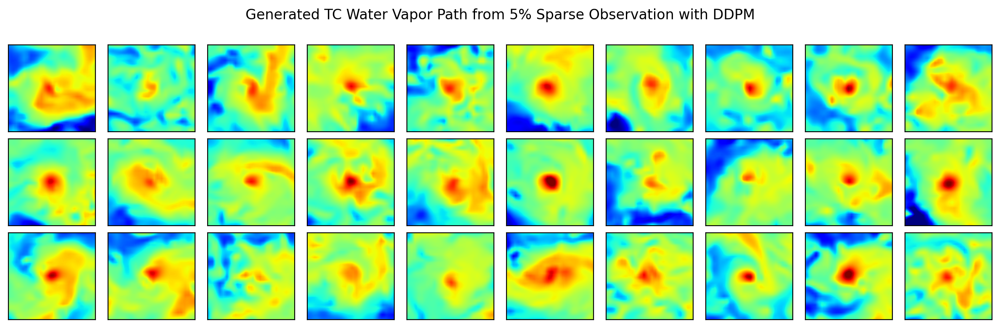

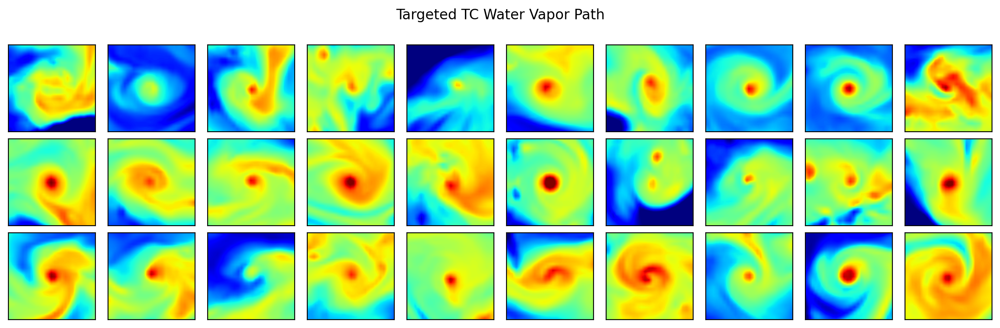

...

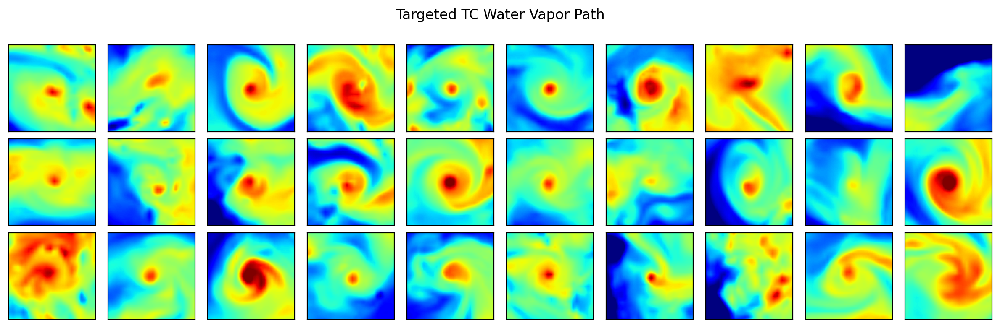

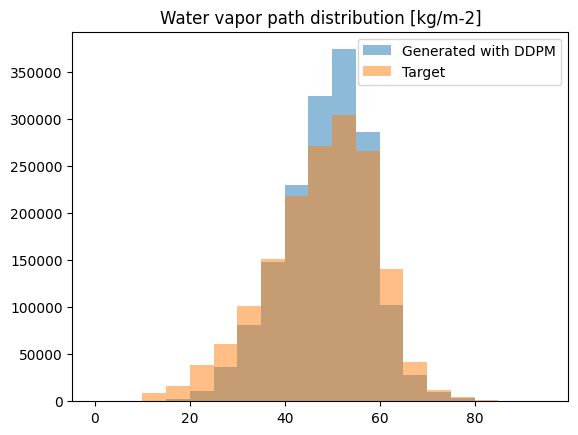

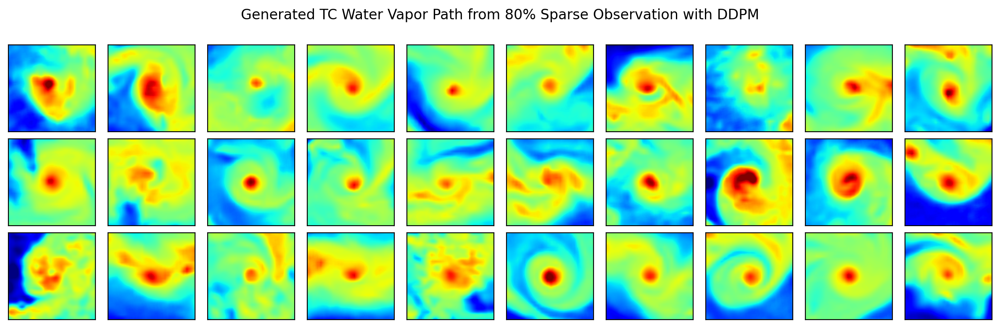

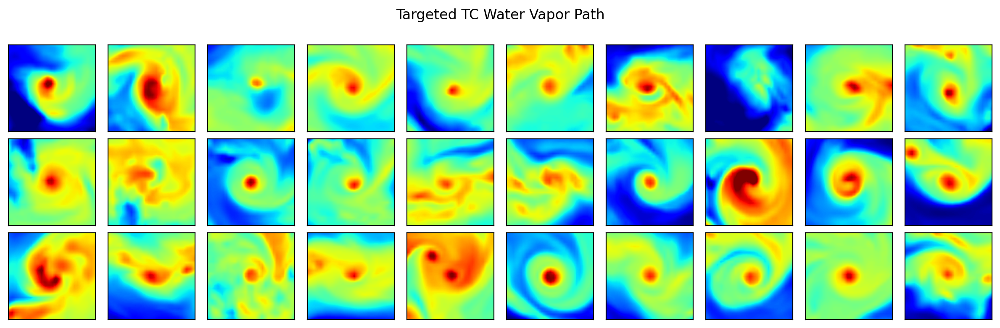

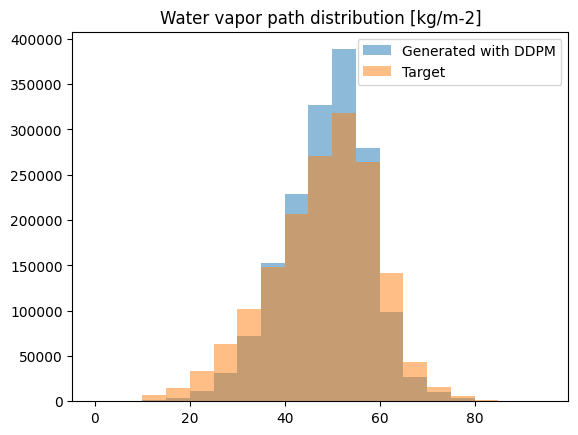

In [9]:
RMSE_all = []
obs_ratio_sample_list = [0, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]
for obs_ratio_sample in obs_ratio_sample_list:
    # sample xx images
    sample_batch_size = 256  
    model_samples, target_samples = gen_samples(sample_batch_size, obs_ratio_sample, test_data)
    
    RMSE = np.sqrt(np.mean((model_samples-target_samples)**2))
    RMSE_all.append(RMSE)
    # unnorm
    model_samples = test_data.unnormalization(model_samples)
    model_samples_plot = rearrange(model_samples[:30], '(br bc) c h w -> br bc h w c', br=3)
    fig = plot(model_samples_plot)
    fig.suptitle(f"Generated TC Water Vapor Path from {obs_ratio_sample*100:.0f}% Sparse Observation with DDPM")
    plt.tight_layout()
    
    # trainning data samples
    target_samples = test_data.unnormalization(target_samples)
    target_samples_plot = rearrange(target_samples[:30], '(br bc) c h w -> br bc h w c', br=3)
    fig = plot(target_samples_plot)
    fig.suptitle(f"Targeted TC Water Vapor Path")
    plt.tight_layout()
    fig,ax = plt.subplots()
    plt.hist(model_samples.flatten(),bins=np.arange(0,100,5),alpha=0.5,label='Generated with DDPM')
    plt.hist(target_samples.flatten(),bins=np.arange(0,100,5),alpha=0.5,label='Target')
    plt.title('Water vapor path distribution [kg/m-2]')
    plt.legend()

Text(0, 0.5, 'rmse')

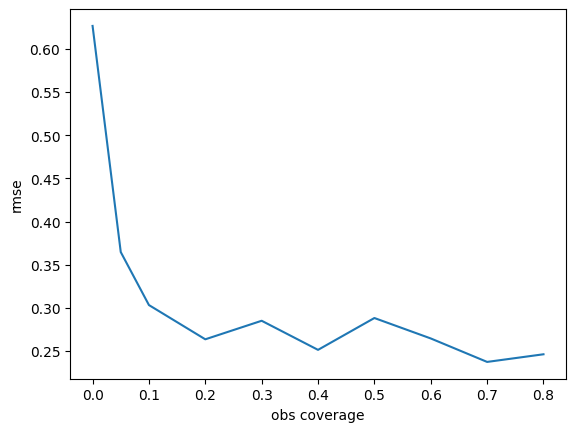

In [11]:
plt.plot(obs_ratio_sample_list, RMSE_all)
plt.xlabel('obs coverage')
plt.ylabel('rmse')